In [1]:
from pathlib import Path
from tqdm import tqdm
import numpy as np
from einops import einsum
import cv2
from PIL import Image
import lovely_tensors as lt
lt.monkey_patch()
import imageio.v3 as iio
import torch

from hmr4d.utils.geo.hmr_cam import estimate_K, create_camera_sensor
from hmr4d.utils.body_model import BodyModelSMPLH, BodyModelSMPLX
from hmr4d.utils.geo_transform import move_to_start_point_face_z
from hmr4d.utils.video_io_utils import get_writer
from hmr4d.utils.vis.renderer import Renderer, get_global_cameras_static, get_ground_params_from_points
from hmr4d.utils.vis.cv2_utils import draw_bbx_xyxy_on_image_batch, draw_kpts_with_conf_batch


In [2]:
smpl = BodyModelSMPLH(
    model_path="inputs/checkpoints/body_models", model_type="smpl",
    gender="neutral", num_betas=10, create_body_pose=False, 
    create_betas=False, create_global_orient=False, create_transl=False,
).cuda()
smplx = BodyModelSMPLX(
    model_path="inputs/checkpoints/body_models", model_type="smplx",
    gender="neutral", num_pca_comps=12, flat_hand_mean=False,
).cuda()
smplx2smpl = torch.load("hmr4d/utils/body_model/smplx2smpl_sparse.pt").cuda()
faces_smpl = smpl.faces
J_regressor = torch.load("hmr4d/utils/body_model/smpl_neutral_J_regressor.pt").cuda()

In [3]:
video_path = Path("inputs/walktest/3002_T1.mp4")
length, height, width, c = iio.improps(video_path, plugin="pyav").shape
r_width, r_height = width, height# width//4, height//4
print(f"{str(video_path)}: {width}x{height}x{length}")

pred = torch.load("outputs/walktest/3002_T1.pt")

inputs/walktest/3002_T1.mp4: 3840x2160x1647


In [4]:
# smpl
renderer_c = Renderer(r_width, r_height, device="cuda", faces=faces_smpl, K=estimate_K(r_width, r_height))

smplx_out = smplx(**pred["smpl_params_incam"])
pred_c_verts = torch.stack([torch.matmul(smplx2smpl, v_) for v_ in smplx_out.vertices])
pred_c_joints, pred_c_valid = renderer_c.project_points_to_full_image(smplx_out.joints)

In [5]:
smplx_out = smplx(**pred["smpl_params_global"])
pred_ay_verts = torch.stack([torch.matmul(smplx2smpl, v_) for v_ in smplx_out.vertices])

pred_gb_verts, pred_gb_joints = move_to_start_point_face_z(pred_ay_verts, J_regressor)

global_R, global_T, global_lights = get_global_cameras_static(
    pred_gb_joints.cpu(), beta=2.0, cam_height_degree=20, target_center_height=1.0,
)
_, _, K = create_camera_sensor(r_width, r_height, 24)
renderer_g = Renderer(r_width, r_height, device="cuda", faces=faces_smpl, K=K)

# -- render mesh -- #
scale, cx, cz = get_ground_params_from_points(pred_gb_joints[:, 0], pred_gb_verts)
renderer_g.set_ground(scale * 1.5, cx, cz)
color = torch.ones(3).float().cuda() * 0.8

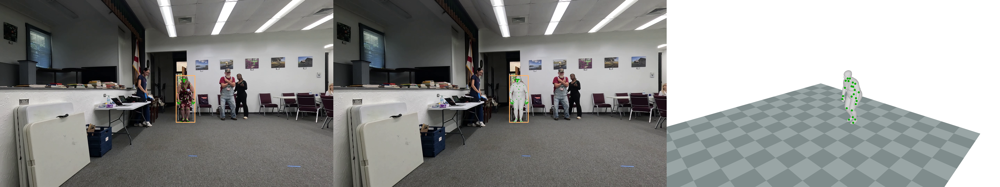

In [6]:
i = 150

img_raw = cv2.resize(iio.imread(video_path, index=i), (r_width, r_height))
img_raw = draw_bbx_xyxy_on_image_batch(pred['bbx_xyxy'][i:i+1], [img_raw], thickness=8)[0]
img_raw = draw_kpts_with_conf_batch([img_raw], pred_c_joints[i:i+1], pred_c_valid[i:i+1], thickness=4)[0]

img_cam = renderer_c.render_mesh(pred_c_verts[i].cuda(), img_raw, [0.8, 0.8, 0.8])
img_cam = draw_kpts_with_conf_batch([img_cam], pred_c_joints[i:i+1], pred_c_valid[i:i+1], thickness=4)[0]

cameras = renderer_g.create_camera(global_R[i], global_T[i])
img_gb = renderer_g.render_with_ground(pred_gb_verts[[i]], color[None], cameras, global_lights)
tmp_joints, tmp_valid = renderer_g.project_points_to_full_image(pred_gb_joints[i:i+1], cameras=cameras, world_space=True)
img_gb = draw_kpts_with_conf_batch([img_gb], tmp_joints, tmp_valid, thickness=12)[0]

Image.fromarray(np.concatenate([img_raw, img_cam, img_gb], axis=1))

In [ ]:
writer = get_writer('tmp.mp4', fps=30, crf=23)
for i in tqdm(range(length), desc=f"Rendering Global"):
    img_raw = cv2.resize(iio.imread(video_path, index=i), (r_width, r_height))
    img_raw = draw_bbx_xyxy_on_image_batch(pred['bbx_xyxy'][i:i+1], [img_raw], thickness=8)[0]
    img_raw = draw_kpts_with_conf_batch([img_raw], pred_c_joints[i:i+1], pred_c_valid[i:i+1], thickness=4)[0]

    img_cam = renderer_c.render_mesh(pred_c_verts[i].cuda(), img_raw, [0.8, 0.8, 0.8])
    img_cam = draw_kpts_with_conf_batch([img_cam], pred_c_joints[i:i+1], pred_c_valid[i:i+1], thickness=4)[0]

    cameras = renderer_g.create_camera(global_R[i], global_T[i])
    img_gb = renderer_g.render_with_ground(pred_gb_verts[[i]], color[None], cameras, global_lights)
    tmp_joints, tmp_valid = renderer_g.project_points_to_full_image(pred_gb_joints[i:i+1], cameras=cameras, world_space=True)
    img_gb = draw_kpts_with_conf_batch([img_gb], tmp_joints, tmp_valid, thickness=12)[0]

    img = np.concatenate([img_raw, img_cam, img_gb], axis=1)
    writer.write_frame(img)
writer.close()

Rendering Global: 100%|██████████| 300/300 [15:15<00:00,  3.05s/it]
